In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
!pip install ultralytics


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 905.3/905.3 kB 19.2 MB/s eta 0:00:00


In [4]:
import sys
import os
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, Dataset
import torch.nn.functional as F
from ultralytics.nn.modules import Conv, SPPF, Bottleneck, C2f, Detect
from ultralytics import YOLO
import yaml
from pathlib import Path
from datetime import datetime
import pandas as pd
import argparse
from sklearn.model_selection import train_test_split
import numpy as np
from PIL import Image
from torchvision import transforms
import matplotlib.pyplot as plt
import shutil # For copying files


class Fire(nn.Module):
    def __init__(self, inplanes, squeeze_planes, expand1x1_planes, expand3x3_planes):
        super(Fire, self).__init__()
        self.squeeze = nn.Conv2d(inplanes, squeeze_planes, kernel_size=1)
        self.squeeze_activation = nn.ReLU(inplace=True)
        self.expand1x1 = nn.Conv2d(squeeze_planes, expand1x1_planes, kernel_size=1)
        self.expand1x1_activation = nn.ReLU(inplace=True)
        self.expand3x3 = nn.Conv2d(squeeze_planes, expand3x3_planes, kernel_size=3, padding=1)
        self.expand3x3_activation = nn.ReLU(inplace=True)

    def forward(self, x):
        x = self.squeeze_activation(self.squeeze(x))
        return torch.cat([
            self.expand1x1_activation(self.expand1x1(x)),
            self.expand3x3_activation(self.expand3x3(x))
        ], 1)

class SqueezeNetBackbone(nn.Module):
    def __init__(self, projection_dim=128):
        super(SqueezeNetBackbone, self).__init__()

        self.features = nn.Sequential(
            nn.Conv2d(3, 96, kernel_size=7, stride=2, padding=3),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=3, stride=2, ceil_mode=True),
            Fire(96, 16, 64, 64),  # Output 128
            Fire(128, 16, 64, 64),  # Output 128
            nn.MaxPool2d(kernel_size=3, stride=2, ceil_mode=True),
            Fire(128, 32, 128, 128),  # Output 256
            Fire(256, 32, 128, 128),  # Output 256
            nn.MaxPool2d(kernel_size=3, stride=2, ceil_mode=True),
            Fire(256, 48, 192, 192), # Output 384
            Fire(384, 48, 192, 192), # Output 384
            Fire(384, 64, 256, 256), # Output 512
            Fire(512, 64, 256, 256), # Output 512
        )
        self.feature_indices = [3, 7, 11] # these are the indices of the feature maps we need before downsampling

        # Initialize weights
        for m in self.modules():
            if isinstance(m, nn.Conv2d):
                nn.init.kaiming_normal_(m.weight, mode='fan_out', nonlinearity='relu')
            elif isinstance(m, nn.BatchNorm2d):
                nn.init.constant_(m.weight, 1)
                nn.init.constant_(m.bias, 0)

        self.projection = nn.Sequential(
                nn.AdaptiveAvgPool2d((1, 1)),
                nn.Flatten(),
                nn.Linear(512, projection_dim),
            )

    def forward(self, x):
        features = []
        for i, layer in enumerate(self.features):
            x = layer(x)
            if i in self.feature_indices:
              features.append(x)

        x = features[-1] # Last feature before MaxPool layer
        projected_x = self.projection(x)

        return projected_x

class CustomNeck(nn.Module):
    def __init__(self, original_neck, neck_channels):
        super().__init__()
        self.neck = original_neck

        self.neck_channels = neck_channels

        # Apply changes during initialization
        self.apply(self._init_weights)

    def _init_weights(self, module):
        if isinstance(module, Conv):
            if module.conv.in_channels == 32:
              module.conv = nn.Conv2d(self.neck_channels[0], module.conv.out_channels, 1)
            elif module.conv.in_channels == 64:
              module.conv = nn.Conv2d(self.neck_channels[1], module.conv.out_channels, 1)
            elif module.conv.in_channels == 128:
              module.conv = nn.Conv2d(self.neck_channels[2], module.conv.out_channels, 1)

    def forward(self, x):
      return self.neck(x)


class YOLOv8SqueezeNet(YOLO):
    def __init__(self, cfg='yolov8n.yaml', ch=3, nc=None, verbose=True):
        super().__init__(cfg)
        self.cfg = cfg
        self.ch = ch
        self.nc = nc
        self._verbose = verbose

        print("Initializing SqueezeNet backbone...")
        # Replace the backbone with SqueezeNet within the model structure
        self.model.model[0] = SqueezeNetBackbone()
        print("SqueezeNet backbone initialized")


        # Modify neck input channels according to SqueezeNet output channels
        print("Adjusting neck input channels...")
        try:
            # Reconstruct the neck
            # Based on the SqueezeNet backbone, the output channels are [128, 256, 384]
            neck_channels = [128, 256, 384]

            # Get the original neck structure from the model for correct parameters
            original_neck = self.model.model[2]

            # Create a new neck
            new_neck = CustomNeck(original_neck, neck_channels)

            self.model.model[2] = new_neck
            print("Neck input channels adjusted successfully")
        except Exception as e:
            print(f"Error adjusting neck channels: {str(e)}")


        if verbose:
            print(self.model)

    def forward(self, x):
        return self.model(x)

def verify_dataset_structure(dataset_path):
    """Verify the dataset structure and return absolute paths"""
    dataset_yaml = os.path.join(dataset_path, 'data.yaml')

    with open(dataset_yaml, 'r') as f:
        data_dict = yaml.safe_load(f)

    # Update paths to use correct structure
    data_dict['train'] = os.path.join(dataset_path, 'train', 'images')
    data_dict['val'] = os.path.join(dataset_path, 'valid', 'images')
    data_dict['test'] = os.path.join(dataset_path, 'test', 'images')

    # Verify paths exist
    for key in ['train', 'val', 'test']:
        if not os.path.exists(data_dict[key]):
            raise FileNotFoundError(f"Directory not found: {data_dict[key]}")

    return data_dict

def setup_training(dataset_path, save_dir):
    save_dir = Path(save_dir)
    save_dir.mkdir(parents=True, exist_ok=True)

    data_dict = verify_dataset_structure(dataset_path)

    yaml_path = save_dir / 'dataset.yaml'
    with open(yaml_path, 'w') as f:
        yaml.dump(data_dict, f)

    return str(yaml_path), save_dir, data_dict

def train_model(model, dataset_yaml, save_dir, data_dict):
    # Extract just the last folder name for the project
    project_name = Path(save_dir).name

    args = dict(
        data=dataset_yaml,
        epochs=50,
        batch=16,
        imgsz=640,
        device='cuda' if torch.cuda.is_available() else 'cpu',
        workers=8,
        project=project_name,
        name='exp',
        exist_ok=True,
        pretrained=True, # use pretrained weights
        optimizer='Adam',
        verbose=True,
        seed=0,
        deterministic=True,
        amp=False
    )

    results = model.train(**args)

    # Move files to the specified save_dir
    source_path = Path(results.save_dir)
    if isinstance(save_dir, str):
        save_dir = Path(save_dir)
    destination_path = save_dir / 'runs' / 'detect' / args['name']

    if os.path.exists(destination_path):
      shutil.rmtree(destination_path) # Remove the folder if it exists

    shutil.copytree(source_path, destination_path) # Copy the folder to the new path

    return results

def evaluate_model(model, dataset_yaml, save_dir):
    results = model.val(data=dataset_yaml)

    metrics = {
        'mAP50': results.box.map50,
        'mAP50-95': results.box.map,
        'precision': results.box.mp,
        'recall': results.box.mr,
    }

    results_df = pd.DataFrame([metrics])
    if isinstance(save_dir, str):
      results_path = os.path.join(save_dir, 'evaluation_results.csv')
    else:
      results_path = save_dir / 'evaluation_results.csv'
    results_df.to_csv(results_path, index=False)

    return metrics

def supcon_loss(features, labels, temperature=0.07, base_temperature=0.07, device="cpu"):
    labels = labels.to(device)
    batch_size = features.shape[0]

    # Calculate mask based on shared labels
    mask = torch.matmul(labels, labels.T) > 0 # This will check if a pair shares any labels
    mask = mask.float().to(device) # move mask to the device of features

    contrast_count = features.shape[1]
    contrast_feature = features

    anchor_feature = contrast_feature
    anchor_count = contrast_count

    # compute logits
    anchor_dot_contrast = torch.div(
        torch.matmul(anchor_feature, contrast_feature.T),
        temperature
    )
    # for numerical stability
    logits_max, _ = torch.max(anchor_dot_contrast, dim=1, keepdim=True)
    logits = anchor_dot_contrast - logits_max.detach()

    # mask-out self-contrast cases
    logits_mask = torch.scatter(
        torch.ones_like(mask).to(device), # move to the device of features
        1,
        torch.arange(batch_size).view(-1, 1).to(device), # move to the device of features
        0
    )
    mask = mask * logits_mask

    # compute log_prob
    exp_logits = torch.exp(logits) * logits_mask
    log_prob = logits - torch.log(exp_logits.sum(1, keepdim=True) + 1e-9) # added small value to prevent nan

    # compute mean of log-likelihood over positive
    mean_log_prob_pos = (mask * log_prob).sum(1) / (mask.sum(1) + 1e-9) # added small value to prevent nan

    # loss
    loss = - (temperature / base_temperature) * mean_log_prob_pos
    loss = loss.mean()
    return loss


class CustomImageDataset(Dataset):
    def __init__(self, image_paths, label_paths, num_classes, transform=None): # Added label_paths, num_classes
        self.image_paths = image_paths
        self.label_paths = label_paths
        self.transform = transform
        self.num_classes = num_classes

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        image_path = self.image_paths[idx]
        label_path = self.label_paths[idx]
        image = Image.open(image_path).convert('RGB')

        if self.transform:
            image = self.transform(image)

        label = self._load_multilabel(label_path)

        return image, label # returns the multi-hot encoded label

    def _load_multilabel(self, label_path):
        label_vector = np.zeros(self.num_classes) # Initialize a vector of zeros
        try:
          with open(label_path, 'r') as label_f:
            for line in label_f:
              class_id = int(line.strip().split(' ')[0]) # Extract class id
              label_vector[class_id] = 1 # Set the vector element of the specific class to 1
        except Exception as e:
            print(f"Error loading labels from {label_path} {str(e)}")

        return torch.tensor(label_vector, dtype=torch.float32) # return as a tensor


def pretrain_backbone(backbone, dataset_path, num_epochs = 20, batch_size = 32, learning_rate = 1e-4, save_dir = None): # reduced learning rate
      # Get data.yaml
      dataset_yaml = os.path.join(dataset_path, 'data.yaml')
      with open(dataset_yaml, 'r') as f:
          data_dict = yaml.safe_load(f)

      num_classes = data_dict['nc']

      # Get all image paths and labels
      image_paths = []
      label_paths = [] # Changed

      for split in ['train', 'val', 'test']:
        try:
            images_dir = os.path.join(dataset_path, split, 'images')
            labels_dir = os.path.join(dataset_path, split, 'labels')

            if not os.path.exists(images_dir):
                continue

            for file_name in os.listdir(images_dir):
              if file_name.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp', '.gif')):
                image_path = os.path.join(images_dir, file_name)
                label_path = os.path.join(labels_dir, os.path.splitext(file_name)[0] + '.txt')

                if os.path.exists(label_path):
                    image_paths.append(image_path)
                    label_paths.append(label_path)
        except Exception as e:
            print(f"Error loading data from {split} {str(e)}")

      # Split into train and test set
      image_paths = np.array(image_paths)
      label_paths = np.array(label_paths) # Changed
      train_image_paths, test_image_paths, train_label_paths, test_label_paths = train_test_split(image_paths, label_paths, test_size=0.2, random_state=42) #Changed

      # Transforms for images
      transform = transforms.Compose([
          transforms.Resize((256, 256)),
          transforms.RandomHorizontalFlip(),
          transforms.ToTensor(),
          transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
      ])

      # Dataset and DataLoaders
      train_dataset = CustomImageDataset(train_image_paths, train_label_paths, num_classes, transform=transform) # Changed
      train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers = 2)

      test_dataset = CustomImageDataset(test_image_paths, test_label_paths, num_classes, transform=transform) # Changed
      test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, num_workers = 2)

      # Optimizer
      optimizer = optim.Adam(backbone.parameters(), lr=learning_rate)

      # Loss device
      device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
      backbone.to(device)

      train_losses = []
      test_losses = []

      for epoch in range(num_epochs):
          backbone.train()
          total_loss = 0
          for images, labels in train_loader:
              optimizer.zero_grad()
              images = images.to(device)
              labels = labels.to(device)

              features = backbone(images)
              loss = supcon_loss(features, labels, device=device) # pass the device variable to supcon_loss to help move tensors to the correct device

              loss.backward()
              optimizer.step()

              total_loss += loss.item()

          avg_train_loss = total_loss / len(train_loader)
          train_losses.append(avg_train_loss)
          print(f"Epoch {epoch + 1}/{num_epochs}, Loss: {avg_train_loss}")

          backbone.eval()
          total_test_loss = 0
          with torch.no_grad():
            for images, labels in test_loader:
              images = images.to(device)
              labels = labels.to(device)
              features = backbone(images)
              loss = supcon_loss(features, labels, device=device)
              total_test_loss += loss.item()
          avg_test_loss = total_test_loss / len(test_loader)
          test_losses.append(avg_test_loss)
          print(f"Validation Loss: {avg_test_loss}")

      print("SupCon pre-training complete.")

      if save_dir: # Save training curve if save_dir is provided
        plt.figure(figsize=(10,5))
        plt.plot(train_losses, label = "Training Loss")
        plt.plot(test_losses, label = "Validation Loss")
        plt.xlabel("Epoch")
        plt.ylabel("Loss")
        plt.title("SupCon Loss Curve")
        plt.legend()
        plt.savefig(os.path.join(save_dir, "supcon_loss_curve.png"))
        plt.close()

      return backbone

def main(dataset_path, save_dir):
    # Disable wandb
    os.environ['WANDB_DISABLED'] = 'true'


    try:
        dataset_yaml, save_dir, data_dict = setup_training(dataset_path, save_dir)

        num_classes = data_dict['nc']
        print(f"Creating YOLOv8SqueezeNet model with {num_classes} classes...")
        # Create Backbone and pretrain it
        backbone = SqueezeNetBackbone()
        backbone = pretrain_backbone(backbone, dataset_path, num_epochs = 20, batch_size = 32, learning_rate = 1e-4, save_dir=save_dir)
        model = YOLOv8SqueezeNet(nc=num_classes)
        # Replace backbone of the model with the pretrained one
        model.model.model[0] = backbone

        trained_results = train_model(model, dataset_yaml, save_dir, data_dict)

        if torch.cuda.is_available():
            trained_model = trained_results.model.to('cuda')

        results = evaluate_model(trained_model, dataset_yaml, save_dir)

        if isinstance(save_dir, str):
          save_dir_path = Path(save_dir)
        else:
          save_dir_path = save_dir

        print(f"\nTraining completed. Results saved in: {save_dir_path}")
        print(f"\nModel weights and training results saved in: {save_dir_path/ 'runs/detect/exp'}")
        print("\nEvaluation Results:")
        for metric, value in results.items():
            print(f"{metric}: {value:.4f}")

    except Exception as e:
        print(f"Error occurred: {str(e)}")
        import traceback
        traceback.print_exc()

if __name__ == "__main__":
    # Set command line arguments directly when running in Colab
    dataset_path = "/content/drive/MyDrive/Rail5class.v2i.yolov8"  # Replace with your dataset path
    save_dir = "/content/drive/MyDrive/YOLOv8_new/squeezenet_experiment_colab2" # Replace with your save directory

    sys.argv = [sys.argv[0], '--dataset', dataset_path, '--save_dir', save_dir]

    parser = argparse.ArgumentParser(description='Train YOLOv8 with a SqueezeNet backbone.')
    parser.add_argument('--dataset', type=str, required=True, help='Path to the dataset directory.')
    parser.add_argument('--save_dir', type=str, required=True, help='Path to save the model and results.')

    args = parser.parse_args()
    main(args.dataset, args.save_dir)

Creating YOLOv8SqueezeNet model with 5 classes...
Epoch 1/20, Loss: 74.19422161579132
Validation Loss: 4.885626633961995
Epoch 2/20, Loss: 3.7527799805005393
Validation Loss: 3.3592291673024497
Epoch 3/20, Loss: 3.351717531681061
Validation Loss: 3.3186843395233154
Epoch 4/20, Loss: 3.334629456202189
Validation Loss: 3.320427656173706
Epoch 5/20, Loss: 3.337703585624695
Validation Loss: 3.3127049605051675
Epoch 6/20, Loss: 3.344091256459554
Validation Loss: 3.310438791910807
Epoch 7/20, Loss: 3.329400817553202
Validation Loss: 3.307593822479248
Epoch 8/20, Loss: 3.3295819759368896
Validation Loss: 3.3115660349527993
Epoch 9/20, Loss: 3.3387317856152854
Validation Loss: 3.307446320851644
Epoch 10/20, Loss: 3.3145209749539695
Validation Loss: 3.309983968734741
Epoch 11/20, Loss: 3.3218993544578552
Validation Loss: 3.3090041478474936
Epoch 12/20, Loss: 3.3080963492393494
Validation Loss: 3.306721051534017
Epoch 13/20, Loss: 3.315360983212789
Validation Loss: 3.306191921234131
Epoch 14/20,

train: Scanning /content/drive/MyDrive/Rail5class.v2i.yolov8/train/labels.cache... 453 images, 6 backgrounds, 0 corrupt: 100%|██████████| 453/453 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))



val: Scanning /content/drive/MyDrive/Rail5class.v2i.yolov8/valid/labels.cache... 43 images, 0 backgrounds, 0 corrupt: 100%|██████████| 43/43 [00:00<?, ?it/s]


Plotting labels to squeezenet_experiment_colab2/exp/labels.jpg... 
optimizer: Adam(lr=0.01, momentum=0.937) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to squeezenet_experiment_colab2/exp
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50      3.84G      3.968      4.448       3.66         10        640: 100%|██████████| 29/29 [00:15<00:00,  1.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.55it/s]

                   all         43         68   7.75e-05     0.0714   0.000155   2.05e-05



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/50      3.88G      3.679      3.706      3.163         13        640: 100%|██████████| 29/29 [00:13<00:00,  2.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.55it/s]

                   all         43         68   7.75e-05     0.0714   0.000155   2.05e-05



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/50      3.93G       3.35      3.713      2.991         12        640: 100%|██████████| 29/29 [00:09<00:00,  3.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.34it/s]

                   all         43         68    0.00112     0.0435   0.000545   0.000121



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/50      3.88G      3.289      3.593      2.948         21        640: 100%|██████████| 29/29 [00:11<00:00,  2.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.36it/s]

                   all         43         68       0.75     0.0208   0.000138   1.82e-05



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/50      3.88G      3.164       3.48      2.872         15        640: 100%|██████████| 29/29 [00:12<00:00,  2.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.06it/s]

                   all         43         68    0.00626      0.112    0.00226   0.000499



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/50      3.88G      2.966      3.349      2.786         19        640: 100%|██████████| 29/29 [00:09<00:00,  3.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.53it/s]

                   all         43         68    0.00195      0.429      0.002   0.000433



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/50      3.88G      2.972      3.384      2.777         18        640: 100%|██████████| 29/29 [00:11<00:00,  2.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.81it/s]

                   all         43         68      0.333      0.114     0.0519     0.0194



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/50      3.88G      2.856      3.306      2.656         12        640: 100%|██████████| 29/29 [00:12<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.40it/s]

                   all         43         68      0.164      0.397      0.161     0.0416



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/50      3.88G      2.858      3.215      2.615         13        640: 100%|██████████| 29/29 [00:09<00:00,  2.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.35it/s]

                   all         43         68      0.341      0.107      0.101      0.023



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/50      3.88G      2.733      3.195      2.615         18        640: 100%|██████████| 29/29 [00:10<00:00,  2.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.59it/s]

                   all         43         68    0.00432      0.381      0.043     0.0111



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/50      3.88G      2.723      3.083      2.548         15        640: 100%|██████████| 29/29 [00:12<00:00,  2.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.63it/s]

                   all         43         68     0.0766      0.104      0.101     0.0289



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/50      3.88G      2.655      2.914      2.478         12        640: 100%|██████████| 29/29 [00:10<00:00,  2.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.41it/s]

                   all         43         68       0.52      0.168     0.0235    0.00699



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/50      3.88G      2.592      2.933      2.387         12        640: 100%|██████████| 29/29 [00:10<00:00,  2.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.42it/s]

                   all         43         68      0.145      0.262     0.0847     0.0237



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/50      3.88G      2.559      3.005       2.45         13        640: 100%|██████████| 29/29 [00:13<00:00,  2.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.15it/s]

                   all         43         68      0.328     0.0743     0.0673     0.0208



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/50      3.88G       2.52      2.871      2.333         14        640: 100%|██████████| 29/29 [00:10<00:00,  2.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.40it/s]

                   all         43         68      0.225      0.263      0.176     0.0798



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/50       3.9G      2.534      2.937      2.372         13        640: 100%|██████████| 29/29 [00:10<00:00,  2.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.11it/s]

                   all         43         68        0.3      0.167     0.0693     0.0175



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/50      3.88G      2.505      2.861      2.368         18        640: 100%|██████████| 29/29 [00:12<00:00,  2.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.39it/s]

                   all         43         68      0.257      0.219      0.151     0.0478



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/50      3.91G      2.495      2.821      2.371         13        640: 100%|██████████| 29/29 [00:10<00:00,  2.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.27it/s]

                   all         43         68      0.326       0.29      0.164     0.0559



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/50      3.88G      2.453      2.744      2.316         22        640: 100%|██████████| 29/29 [00:09<00:00,  2.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.43it/s]

                   all         43         68      0.172       0.21      0.174     0.0841



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/50      3.88G       2.42      2.792      2.284         18        640: 100%|██████████| 29/29 [00:12<00:00,  2.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.95it/s]


                   all         43         68      0.282      0.258      0.257      0.114

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/50      3.88G       2.37      2.689      2.253         17        640: 100%|██████████| 29/29 [00:10<00:00,  2.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.39it/s]

                   all         43         68      0.306      0.368      0.272      0.112



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/50      3.88G      2.341      2.644      2.208         17        640: 100%|██████████| 29/29 [00:09<00:00,  3.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.52it/s]

                   all         43         68     0.0845      0.212       0.11     0.0528



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/50      3.88G      2.417      2.658      2.304         10        640: 100%|██████████| 29/29 [00:13<00:00,  2.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.36it/s]


                   all         43         68      0.668      0.255      0.201     0.0691

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/50      3.88G      2.317      2.643      2.185         11        640: 100%|██████████| 29/29 [00:10<00:00,  2.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.46it/s]

                   all         43         68      0.161      0.183      0.179     0.0626



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/50      3.88G      2.385      2.639      2.191         14        640: 100%|██████████| 29/29 [00:10<00:00,  2.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.60it/s]

                   all         43         68      0.674      0.353      0.282     0.0987



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/50      3.88G      2.286      2.582      2.184          7        640: 100%|██████████| 29/29 [00:13<00:00,  2.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.24it/s]

                   all         43         68      0.204      0.294      0.217      0.071



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/50      3.88G      2.303      2.681      2.204          9        640: 100%|██████████| 29/29 [00:11<00:00,  2.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.30it/s]

                   all         43         68      0.272      0.404      0.199     0.0663



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/50      3.88G      2.236      2.637      2.159         15        640: 100%|██████████| 29/29 [00:09<00:00,  2.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.30it/s]

                   all         43         68      0.325      0.419       0.33      0.165



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/50      3.88G      2.228      2.497      2.101         24        640: 100%|██████████| 29/29 [00:12<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.94it/s]

                   all         43         68      0.203      0.323       0.26      0.126



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/50      3.88G      2.256      2.503      2.084         15        640: 100%|██████████| 29/29 [00:10<00:00,  2.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.28it/s]

                   all         43         68      0.289      0.294      0.302      0.149



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/50      3.88G      2.235      2.578      2.135         20        640: 100%|██████████| 29/29 [00:08<00:00,  3.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.38it/s]

                   all         43         68      0.322      0.397      0.329      0.133



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/50      3.88G      2.136      2.448      2.027         10        640: 100%|██████████| 29/29 [00:12<00:00,  2.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.01it/s]

                   all         43         68      0.301      0.305      0.326      0.148



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/50      3.88G      2.164      2.496      2.051          8        640: 100%|██████████| 29/29 [00:11<00:00,  2.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.45it/s]

                   all         43         68      0.658      0.337      0.366      0.171



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/50      3.88G      2.141      2.448      2.013          9        640: 100%|██████████| 29/29 [00:09<00:00,  3.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.81it/s]

                   all         43         68      0.325      0.427      0.359       0.18



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/50       3.9G      2.155      2.444      2.072         18        640: 100%|██████████| 29/29 [00:11<00:00,  2.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.61it/s]

                   all         43         68      0.144      0.234      0.145     0.0827



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/50      3.88G      2.081      2.368      1.986         14        640: 100%|██████████| 29/29 [00:12<00:00,  2.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.49it/s]

                   all         43         68      0.187      0.402      0.333      0.152



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/50      3.88G      2.075      2.392      1.994         16        640: 100%|██████████| 29/29 [00:09<00:00,  3.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.49it/s]


                   all         43         68       0.32      0.338      0.334      0.154

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/50      3.88G      2.101      2.406      2.013         10        640: 100%|██████████| 29/29 [00:11<00:00,  2.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.49it/s]

                   all         43         68       0.31      0.314      0.332      0.131



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/50      3.88G      2.064      2.377      2.005         20        640: 100%|██████████| 29/29 [00:11<00:00,  2.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.97it/s]

                   all         43         68      0.617      0.262       0.37      0.161



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/50      3.88G      2.074       2.36      1.969         11        640: 100%|██████████| 29/29 [00:09<00:00,  3.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.59it/s]

                   all         43         68      0.221       0.43      0.371      0.174


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/50      3.88G      2.198       2.39      1.836          7        640: 100%|██████████| 29/29 [00:11<00:00,  2.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.51it/s]

                   all         43         68      0.507      0.325      0.312      0.107



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/50      3.88G      2.201      2.257       1.79          8        640: 100%|██████████| 29/29 [00:11<00:00,  2.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.87it/s]

                   all         43         68      0.594      0.274      0.367      0.158



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/50      3.88G      2.165      2.247      1.792          7        640: 100%|██████████| 29/29 [00:11<00:00,  2.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.35it/s]

                   all         43         68      0.382      0.421      0.401      0.171



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/50      3.88G      2.101      2.184       1.78          9        640: 100%|██████████| 29/29 [00:08<00:00,  3.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.49it/s]

                   all         43         68      0.658      0.337      0.429      0.183



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/50      3.88G      2.125      2.184      1.793          8        640: 100%|██████████| 29/29 [00:12<00:00,  2.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.60it/s]

                   all         43         68      0.687       0.38      0.423      0.197



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/50      3.88G      2.104      2.123       1.79          8        640: 100%|██████████| 29/29 [00:11<00:00,  2.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.49it/s]

                   all         43         68      0.274      0.433      0.419      0.186



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/50      3.88G      2.097      2.143      1.806          7        640: 100%|██████████| 29/29 [00:09<00:00,  3.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.93it/s]

                   all         43         68      0.348      0.537      0.405      0.172



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/50      3.88G        2.1      2.075       1.74          8        640: 100%|██████████| 29/29 [00:12<00:00,  2.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.58it/s]

                   all         43         68      0.285      0.487      0.409      0.174



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/50      3.88G      2.096      2.054      1.716         16        640: 100%|██████████| 29/29 [00:09<00:00,  2.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.74it/s]

                   all         43         68      0.291      0.487      0.445      0.208



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/50      3.88G      2.041      2.032      1.757          6        640: 100%|██████████| 29/29 [00:09<00:00,  2.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.60it/s]

                   all         43         68      0.294      0.499      0.439      0.191



50 epochs completed in 0.191 hours.
Optimizer stripped from squeezenet_experiment_colab2/exp/weights/last.pt, 6.3MB
Optimizer stripped from squeezenet_experiment_colab2/exp/weights/best.pt, 6.3MB

Validating squeezenet_experiment_colab2/exp/weights/best.pt...
Ultralytics 8.3.57 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLOv8n summary (fused): 168 layers, 3,006,623 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.25it/s]


                   all         43         68      0.287      0.487      0.445      0.208
              DefecRCF         12         14          0          0      0.197     0.0538
               DefectB         12         12      0.362          1       0.64      0.319
               DefectC         11         19        0.4      0.211      0.293      0.114
               DefectS         17         23      0.384      0.739      0.649      0.345
Speed: 0.3ms preprocess, 4.2ms inference, 0.0ms loss, 1.3ms postprocess per image
Results saved to squeezenet_experiment_colab2/exp
Error occurred: 'DetMetrics' object has no attribute 'model'. See valid attributes below.

    Utility class for computing detection metrics such as precision, recall, and mean average precision (mAP) of an
    object detection model.

    Args:
        save_dir (Path): A path to the directory where the output plots will be saved. Defaults to current directory.
        plot (bool): A flag that indicates whether to plot 

Traceback (most recent call last):
  File "<ipython-input-4-bba788e55c64>", line 445, in main
    trained_model = trained_results.model.to('cuda')
  File "/usr/local/lib/python3.10/dist-packages/ultralytics/utils/__init__.py", line 221, in __getattr__
    raise AttributeError(f"'{name}' object has no attribute '{attr}'. See valid attributes below.\n{self.__doc__}")
AttributeError: 'DetMetrics' object has no attribute 'model'. See valid attributes below.

    Utility class for computing detection metrics such as precision, recall, and mean average precision (mAP) of an
    object detection model.

    Args:
        save_dir (Path): A path to the directory where the output plots will be saved. Defaults to current directory.
        plot (bool): A flag that indicates whether to plot precision-recall curves for each class. Defaults to False.
        on_plot (func): An optional callback to pass plots path and data when they are rendered. Defaults to None.
        names (dict of str): A dict


0: 640x640 2 DefectSs, 9.2ms
Speed: 1.9ms preprocess, 9.2ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


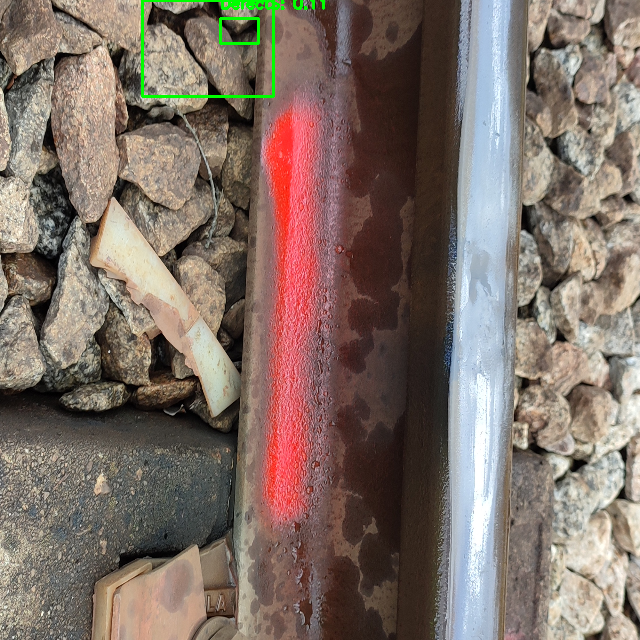

Processed 15422_Cod471.jpg with center crop zoom.

0: 640x640 3 DefectSs, 11.1ms
Speed: 3.2ms preprocess, 11.1ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)


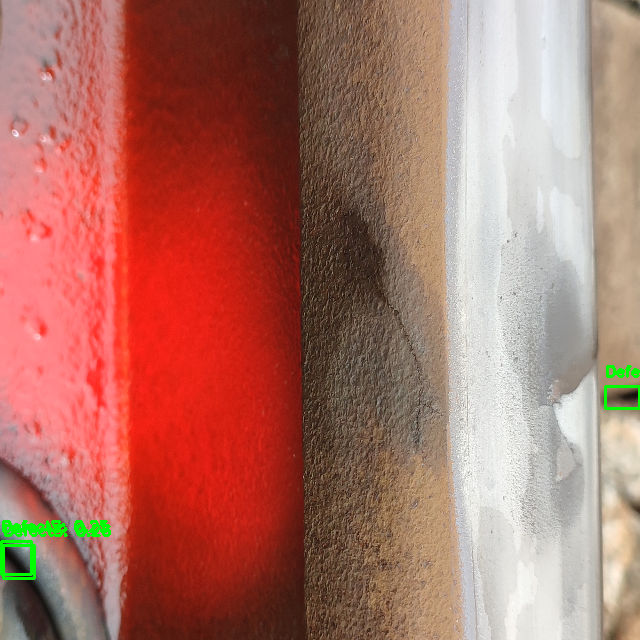

Processed 17069_Cod211.jpg with center crop zoom.

0: 640x640 (no detections), 10.3ms
Speed: 2.1ms preprocess, 10.3ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x480 6 DefectBs, 2 DefectSs, 10.2ms
Speed: 3.8ms preprocess, 10.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


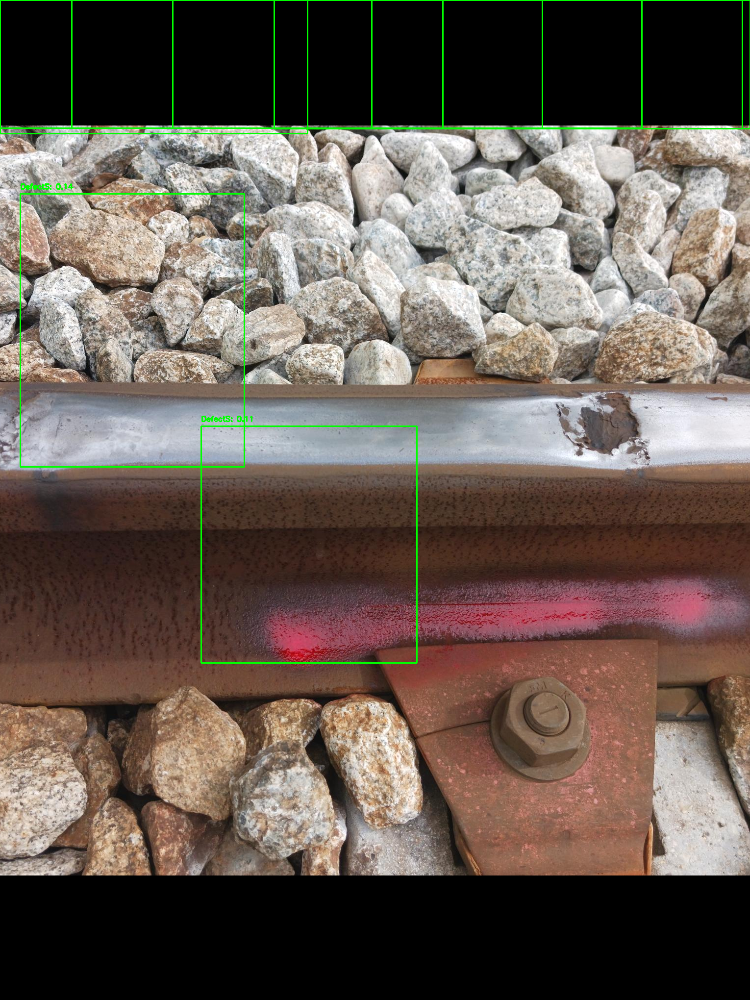

Processed 17390_Cod472.jpg with rotation 90°.

0: 640x640 1 DefectS, 12.8ms
Speed: 2.4ms preprocess, 12.8ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)


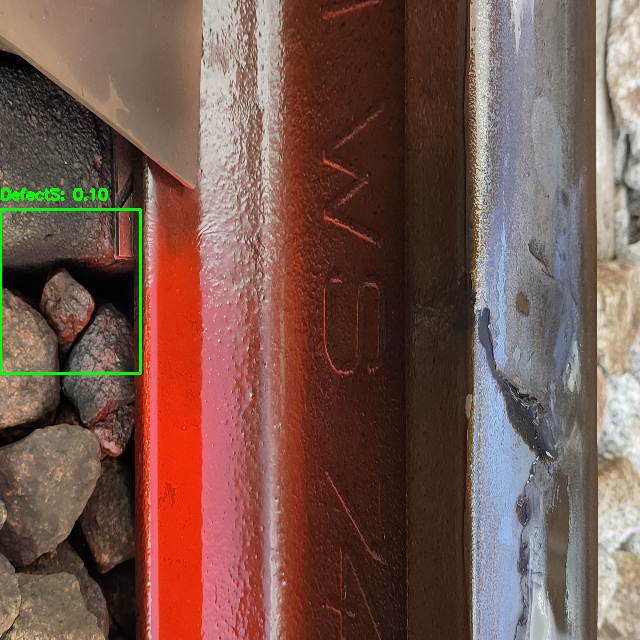

Processed 19567_Cod471.jpg with center crop zoom.

0: 640x640 4 DefectSs, 8.4ms
Speed: 2.5ms preprocess, 8.4ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)


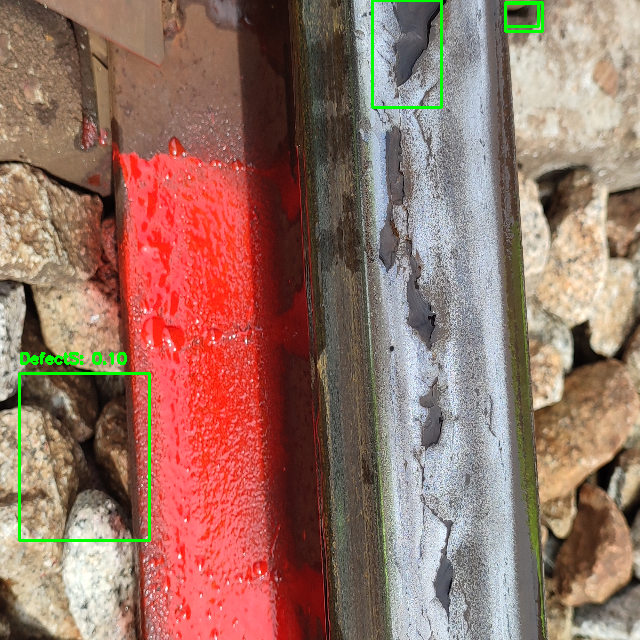

Processed 15180_Cod471.jpg with center crop zoom.

0: 640x640 (no detections), 9.0ms
Speed: 2.6ms preprocess, 9.0ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x192 2 DefectBs, 8 DefectSs, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 192)


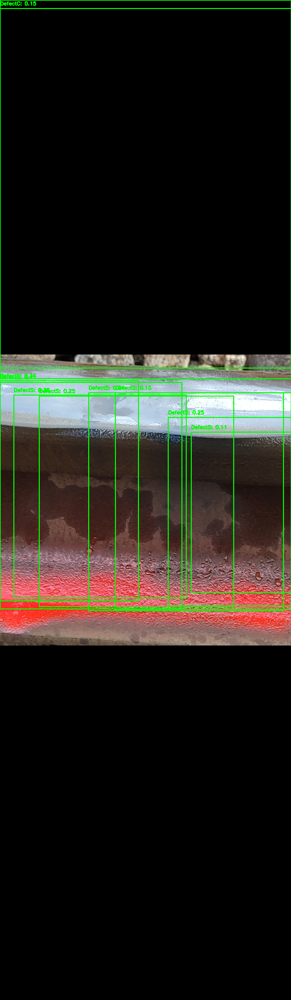

Processed 15422_Cod471_crop0.jpg with rotation 90°.

0: 640x640 4 DefectCs, 38 DefectSs, 19.4ms
Speed: 2.5ms preprocess, 19.4ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)


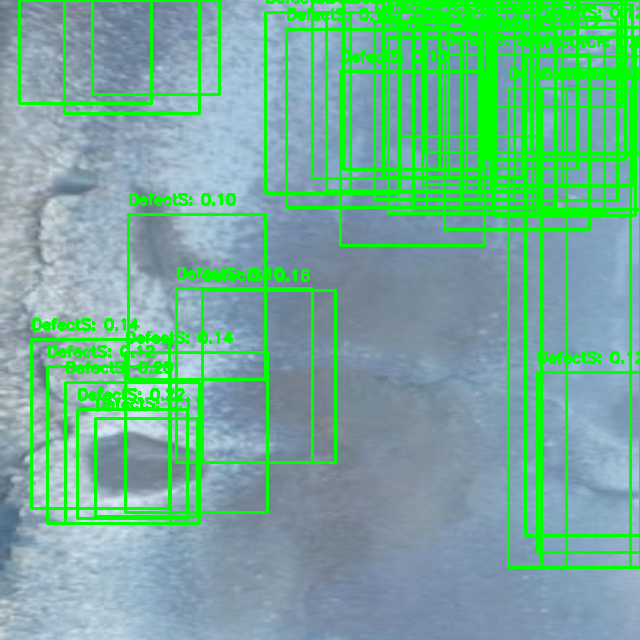

Processed 19973_Cod211_crop0.jpg with center crop zoom.

0: 640x640 28 DefectSs, 13.5ms
Speed: 3.7ms preprocess, 13.5ms inference, 4.7ms postprocess per image at shape (1, 3, 640, 640)


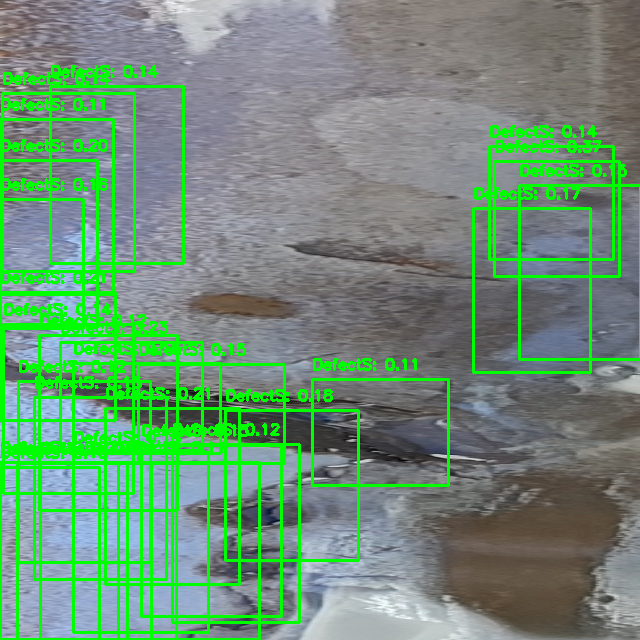

Processed 19567_Cod471_crop0.jpg with center crop zoom.

0: 640x640 5 DefectSs, 8.4ms
Speed: 2.2ms preprocess, 8.4ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)


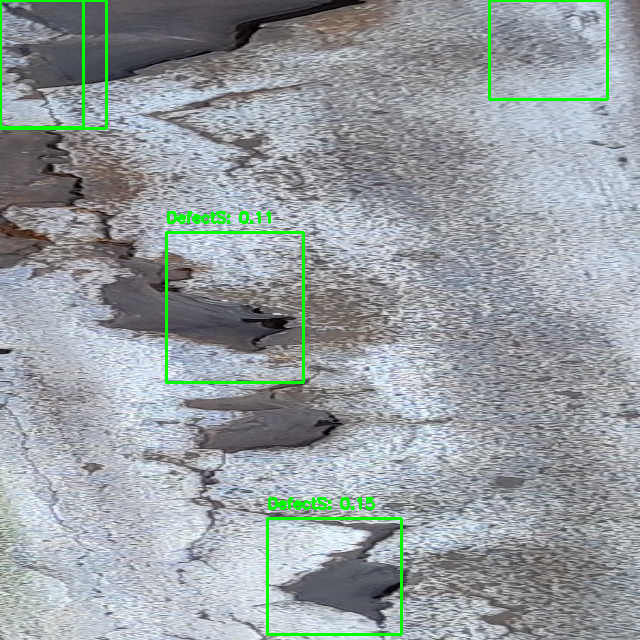

Processed 15180_Cod471_crop0.jpg with center crop zoom.
Detection of defects completed!


In [10]:
from ultralytics import YOLO
import cv2
import os
import numpy as np
from google.colab.patches import cv2_imshow  # Import cv2_imshow for Colab

# Load the trained YOLO model
model = YOLO("/content/drive/MyDrive/YOLOv8_new/squeezenet_experiment_colab2/runs/detect/exp/weights/best.pt")

# Define the new image database directory
input_images_path = "/content/drive/MyDrive/FotosDefeitos"  # Directory with new images
output_path =  "/content/drive/MyDrive/FotosDefeitos/132squeezenet_experiment"    # Directory to save detected images with bounding boxes
os.makedirs(output_path, exist_ok=True)

class_names = [
    "DefecB", "DefectC", "DefectRCF", "DefectS", "Non-Defecet",
]

# List all images in the folder
image_files = [f for f in os.listdir(input_images_path) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]

# Desired image size for YOLO model
resize_width = 640
resize_height = 640

def center_crop_zoom(img, crop_fraction=0.6):
    """
    Performs a center crop zoom on the input image.
    Args:
        img: Input image as a NumPy array.
        crop_fraction: Fraction of the image to crop (0.0 to 1.0).
    Returns:
        Cropped and resized image.
    """
    h, w, _ = img.shape
    crop_h, crop_w = int(h * crop_fraction), int(w * crop_fraction)

    # Calculate cropping coordinates
    start_y = (h - crop_h) // 2
    end_y = start_y + crop_h
    start_x = (w - crop_w) // 2
    end_x = start_x + crop_w

    # Crop the image
    cropped_img = img[start_y:end_y, start_x:end_x]

    # Resize back to the desired size
    resized_cropped_img = cv2.resize(cropped_img, (resize_width, resize_height))

    return resized_cropped_img

def rotate_image(img, angle):
    """
    Rotates the input image by a specified angle.
    Args:
        img: Input image as a NumPy array.
        angle: Rotation angle in degrees.
    Returns:
        Rotated image.
    """
    h, w = img.shape[:2]
    center = (w // 2, h // 2)
    rotation_matrix = cv2.getRotationMatrix2D(center, angle, 1.0)
    rotated_img = cv2.warpAffine(img, rotation_matrix, (w, h))
    return rotated_img

def process_image(img, img_file, output_path):
    """
    Processes the image with the YOLO model and saves the results.
    Returns True if defects are detected; otherwise False.
    """
    results = model(img, conf=0.1)  # Lowered confidence threshold for debugging

    # Check for detections
    if len(results[0].boxes) == 0:
        return False

    # Log detected objects
    for i, bbox in enumerate(results[0].boxes.xyxy):  # Extract bounding boxes
        x1, y1, x2, y2 = map(int, bbox)
        conf = results[0].boxes.conf[i]  # Confidence score
        cls = int(results[0].boxes.cls[i])  # Class ID
        class_name = class_names[cls] if cls < len(class_names) else f"Unknown({cls})"

        # Draw the bounding box on the image
        label = f"{class_name}: {conf:.2f}"
        cv2.rectangle(img, (x1, y1), (x2, y2), (0, 255, 0), 2)
        cv2.putText(img, label, (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)

    # Save the image with bounding boxes
    output_file = os.path.join(output_path, f"{os.path.splitext(img_file)[0]}_with_bboxes.jpg")
    cv2.imwrite(output_file, img)
    cv2_imshow(img)  # Display the result in Colab

    return True

# Process each image with augmentations
for img_file in image_files:
    img_path = os.path.join(input_images_path, img_file)
    img = cv2.imread(img_path)

    # 1. Perform Center Crop Zoom
    cropped_zoomed_img = center_crop_zoom(img, crop_fraction=0.5)
    if process_image(cropped_zoomed_img, img_file, output_path):
        print(f"Processed {img_file} with center crop zoom.")
        continue

    # 2. Try Rotation (90, 180, and 270 degrees)
    for angle in [90, 180, 270]:
        rotated_img = rotate_image(img, angle)
        if process_image(rotated_img, f"{img_file}_rot{angle}", output_path):
            print(f"Processed {img_file} with rotation {angle}°.")
            break
    else:  # Only executed if no break occurs (i.e., no detection)
        # 3. Try Grayscale Conversion
        gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        gray_img = cv2.cvtColor(gray_img, cv2.COLOR_GRAY2BGR)  # Convert back to 3 channels
        if process_image(gray_img, f"{img_file}_gray", output_path):
            print(f"Processed {img_file} with grayscale.")
        else:
            print(f"No valid detections for {img_file} even after augmentations. Skipping.")

print("Detection of defects completed!")
